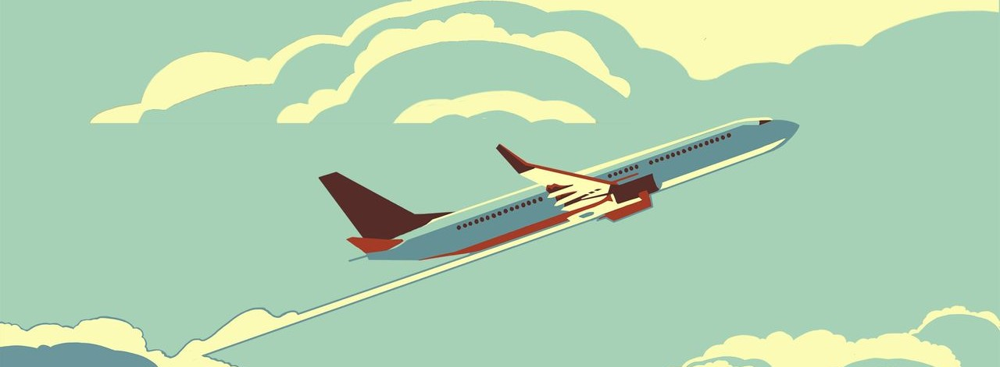

# <center><font color="black">**AIRLINE PASSENGER SATISFACTION**</font></center>

**Kelompok `nam-pyeong`**
1. Allissa Rahman (1706984991)
2. Fitria Dwi Wulandari (1706985041)
3. Nurlia Hidayanti (1706047290)

Seluruhnya berkontribusi secara bersama-sama (membuat code secara bergantian) karena melakukan analisis datanya melalui *video conference*. Kemudian ditambah pembagian sebagai berikut :
- narator presentasi : Allissa Rahman dan Nurlia Hidayanti
- pembuat presentasi (powerpoint) : Fitria Dwi Wulandari

> Data yang digunakan adalah data survei kepuasan penumpang dari salah satu maskapai penerbangan di U.S.
<br> Sumber data : [https://www.kaggle.com/teejmahal20/airline-passenger-satisfaction](https://www.kaggle.com/teejmahal20/airline-passenger-satisfaction)

## **File Loading**

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns

In [ ]:
# Import Dataset
airline = pd.read_csv('https://raw.githubusercontent.com/allissarahman/final-project-data-mining-classification-/main/train.csv')

In [ ]:
# Melihat Bentuk Data
print('Ukuran Data', airline.shape)
airline.head()

Ukuran Data (103904, 25)


,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


**Keterangan:**

* `id` : Unique id number to each passenger

* `Gender` : Gender of the passengers

* `Customer Type` : The customer type

* `Age` : The actual age of the passengers

* `Type of Travel` : Purpose of the flight of the passengers

* `Class` : Travel class in the plane of the passengers

* `Flight distance` : The flight distance of this journey

* `Inflight wifi service` : Satisfaction level of the inflight wifi service (0:Not Applicable;1-5)

* `Departure/Arrival time convenient` : Satisfaction level of Departure/Arrival time convenient

* `Ease of Online booking` : Satisfaction level of online booking

* `Gate location` : Satisfaction level of gate location

* `Food and drink` : Satisfaction level of food and drink

* `Online boarding` : Satisfaction level of online boarding

* `Seat comfort` : Satisfaction level of seat comfort

* `Inflight entertainment` : Satisfaction level of inflight entertainment

* `On-board service` : Satisfaction level of on-board service

* `Leg room service` : Satisfaction level of leg room service

* `Baggage handling` : Satisfaction level of baggage handling

* `Check-in service` : Satisfaction level of check-in service

* `Inflight service` : Satisfaction level of inflight service

* `Cleanliness` : Satisfaction level of cleanliness

* `Departure Delay in Minutes` : Minutes delayed when departure

* `Arrival Delay in Minutes` : Minutes delayed when Arrival

* `Satisfaction` : Airline satisfaction level (Neutral/Dissatisfaction, Satisfaction)

### ***Data Preprocessing***

#### **Menghapus Kolom yang Tidak Diperlukan**

In [ ]:
# Menghapus Kolom 'Unnamed: 0' dan 'id'
airline = airline.drop(['Unnamed: 0', 'id'], axis = 1)
airline.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


#### **Melihat Kategori Variabel**

In [ ]:
from sklearn.preprocessing import LabelEncoder
def Encode(df,col):
    
    encode = LabelEncoder()
    encode.fit(df[col])
    new_column = encode.transform(df[col])
    test = np.unique(new_column)
    result = encode.inverse_transform(test)
    for i in range(len(test)):
        print(result[i],":".format(),test[i])
    print("=======================================")
    return new_column

In [ ]:
airline_cat = airline.copy()
object_attribute = []
for col in airline_cat.columns:
    if airline_cat[col].dtype== "object":
        object_attribute.append(col)
object_attribute

['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction']

In [ ]:
for col in object_attribute:
    if airline_cat[col].dtype=="object":
        airline_cat[col] = Encode(airline_cat,col)
    else:
        print("Encoded")
        break

Female : 0
Male : 1
Loyal Customer : 0
disloyal Customer : 1
Business travel : 0
Personal Travel : 1
Business : 0
Eco : 1
Eco Plus : 2
neutral or dissatisfied : 0
satisfied : 1


#### **Mengoreksi Tipe Variabel**

In [ ]:
print('Tipe Variabel Sebelum Dikoreksi, adalah:')
airline.info()

Tipe Variabel Sebelum Dikoreksi, adalah:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11

In [ ]:
# Mengoreksi Tipe Variabel
airline[["Gender","Customer Type","Type of Travel","Class","satisfaction"]] = airline[["Gender","Customer Type","Type of Travel","Class","satisfaction"]].apply(lambda x: x.astype('category'))

In [ ]:
print('Tipe Variabel Setelah Dikoreksi, adalah:')
airline.info()

Tipe Variabel Setelah Dikoreksi, adalah:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   Gender                             103904 non-null  category
 1   Customer Type                      103904 non-null  category
 2   Age                                103904 non-null  int64   
 3   Type of Travel                     103904 non-null  category
 4   Class                              103904 non-null  category
 5   Flight Distance                    103904 non-null  int64   
 6   Inflight wifi service              103904 non-null  int64   
 7   Departure/Arrival time convenient  103904 non-null  int64   
 8   Ease of Online booking             103904 non-null  int64   
 9   Gate location                      103904 non-null  int64   
 10  Food and drink                     103904 non-null 

#### **Mengecek Duplikasi Data**

In [ ]:
print('Total Duplikasi pada Data:', airline.duplicated().sum())

Total Duplikasi pada Data: 0


#### **Memeriksa *Missing Value***

In [ ]:
print('\nJumlah Missing Values pada masing-masing Kolom, adalah:')
airline.isnull().sum().sort_values(ascending=False)


Jumlah Missing Values pada masing-masing Kolom, adalah:


Arrival Delay in Minutes             310
satisfaction                           0
Food and drink                         0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Gender                                 0
dtype: int64

In [ ]:
# Mengisi Missing Value dengan Median
airline['Arrival Delay in Minutes'] = airline['Arrival Delay in Minutes'].fillna(airline['Arrival Delay in Minutes'].median())
# Checking again
np.isnan(airline['Arrival Delay in Minutes']).value_counts()

False    103904
Name: Arrival Delay in Minutes, dtype: int64

In [ ]:
print('\nJumlah Missing Values Setelah Di-imputasi, adalah:')
airline.isnull().sum().sort_values(ascending=False)


Jumlah Missing Values Setelah Di-imputasi, adalah:


satisfaction                         0
Food and drink                       0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Online boarding                      0
Arrival Delay in Minutes             0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Gender                               0
dtype: int64

### ***Data Visualization***

In [ ]:
from google.colab import files

#### **Variabel Kategorik dengan Variabel Target (*Customer Satisfaction*)**

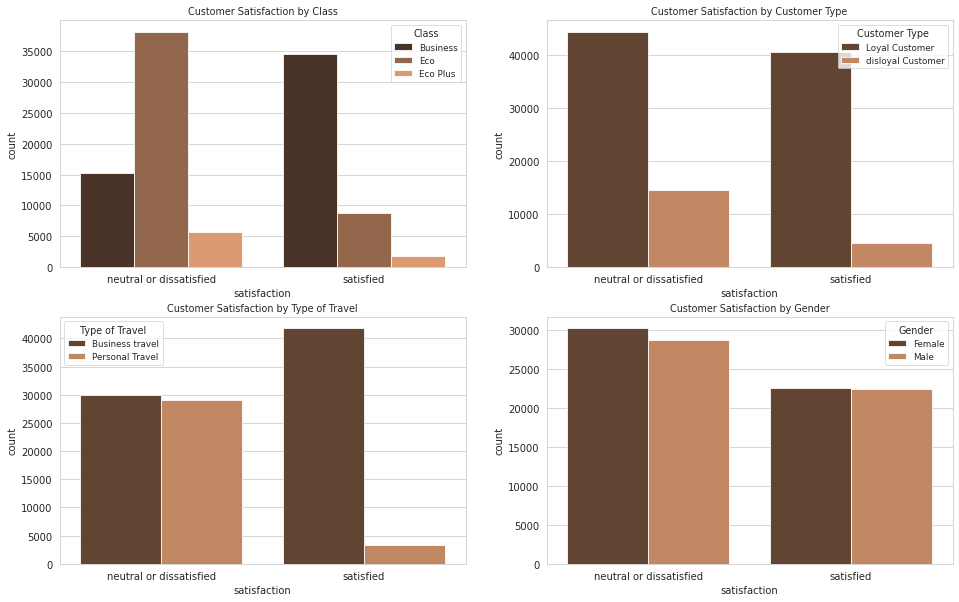

In [ ]:
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
fig, ax = plt.subplots(2,2, figsize=(16,10))
sns.set_context('paper', font_scale=1)

ax[0][0].set_title('Customer Satisfaction by Class')
sns.countplot(x='satisfaction', data = airline, hue = 'Class', palette = 'copper', ax=ax[0][0])

ax[0][1].set_title('Customer Satisfaction by Customer Type')
sns.countplot(x='satisfaction', data = airline, hue = 'Customer Type', palette = 'copper', ax=ax[0][1])

ax[1][0].set_title('Customer Satisfaction by Type of Travel')
sns.countplot(x='satisfaction', data = airline, hue = 'Type of Travel', palette = 'copper', ax=ax[1][0])

ax[1][1].set_title('Customer Satisfaction by Gender')
sns.countplot(x='satisfaction', data = airline, hue = 'Gender', palette = 'copper', ax=ax[1][1])

# plt.savefig("kategorik & target.png")

In [ ]:
# files.download("kategorik & target.png") 

#### **Variabel Berskala Likert**

In [ ]:
def bar_plot(variable):
    
    var=airline[variable]
    var_Value=var.value_counts()
    
    # Visualize
    plt.figure(figsize=(12,6))
    plt.bar(var_Value.index,var_Value.values, color='darksalmon')
    
    plt.xlabel("Score")
    plt.ylabel("Frequency")
    plt.title(variable)
    plt.show()
    print("{}: \n {}".format(variable,var_Value))

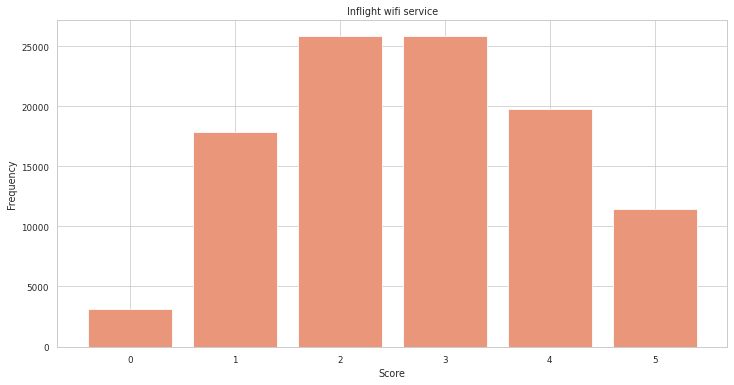

Inflight wifi service: 
 3    25868
2    25830
4    19794
1    17840
5    11469
0     3103
Name: Inflight wifi service, dtype: int64


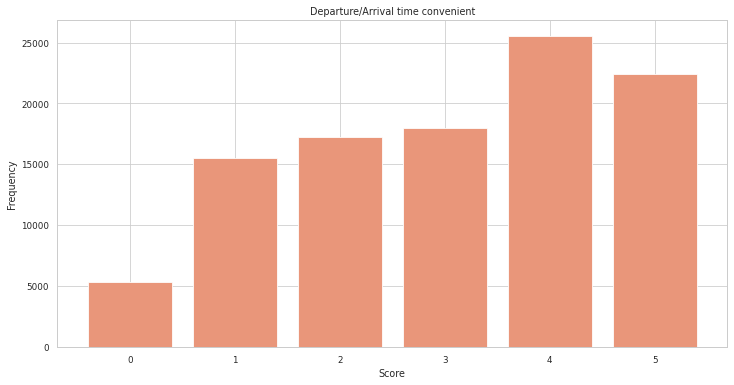

Departure/Arrival time convenient: 
 4    25546
5    22403
3    17966
2    17191
1    15498
0     5300
Name: Departure/Arrival time convenient, dtype: int64


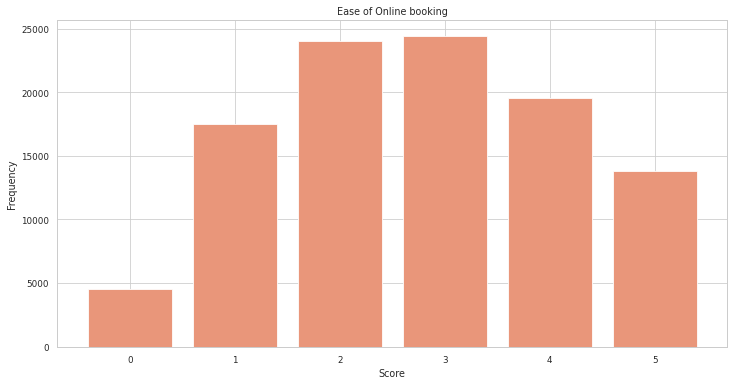

Ease of Online booking: 
 3    24449
2    24021
4    19571
1    17525
5    13851
0     4487
Name: Ease of Online booking, dtype: int64


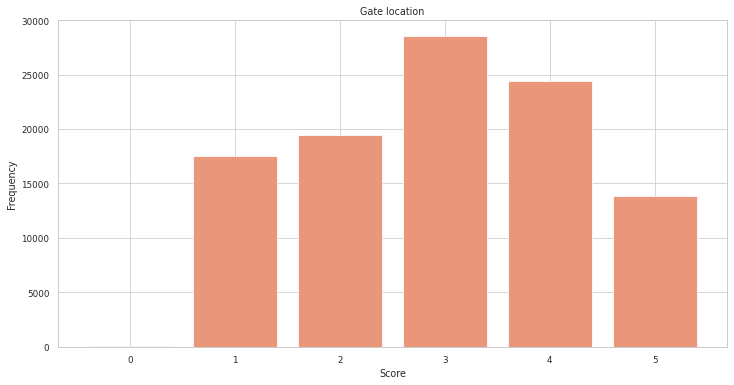

Gate location: 
 3    28577
4    24426
2    19459
1    17562
5    13879
0        1
Name: Gate location, dtype: int64


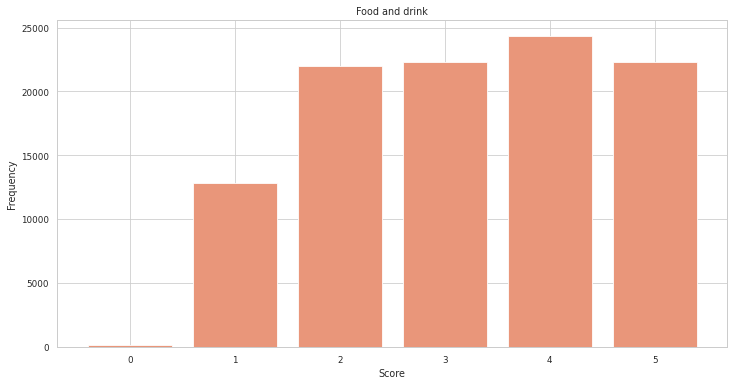

Food and drink: 
 4    24359
5    22313
3    22300
2    21988
1    12837
0      107
Name: Food and drink, dtype: int64


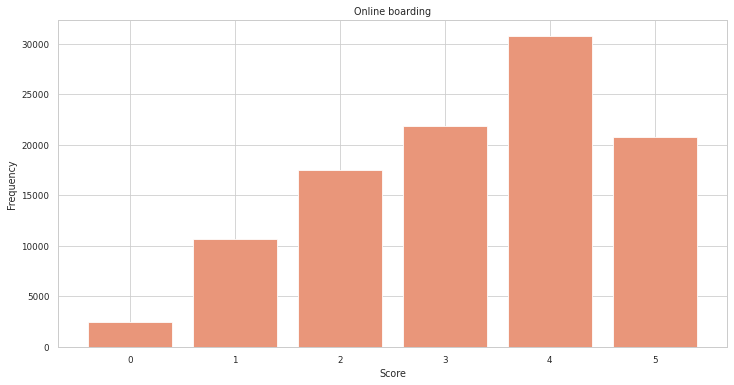

Online boarding: 
 4    30762
3    21804
5    20713
2    17505
1    10692
0     2428
Name: Online boarding, dtype: int64


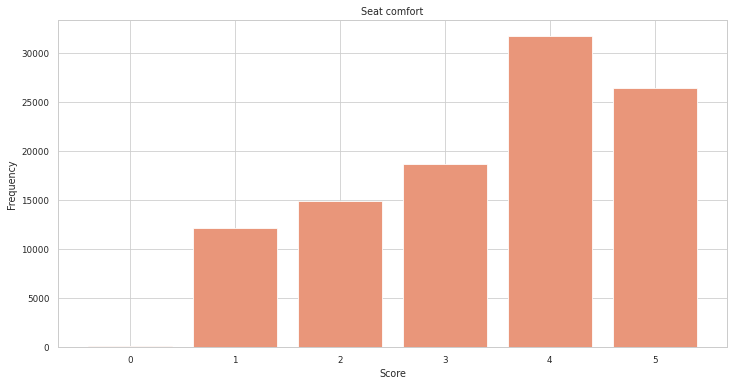

Seat comfort: 
 4    31765
5    26470
3    18696
2    14897
1    12075
0        1
Name: Seat comfort, dtype: int64


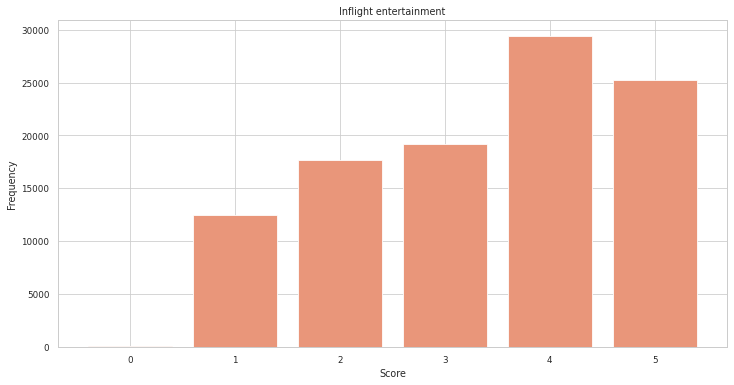

Inflight entertainment: 
 4    29423
5    25213
3    19139
2    17637
1    12478
0       14
Name: Inflight entertainment, dtype: int64


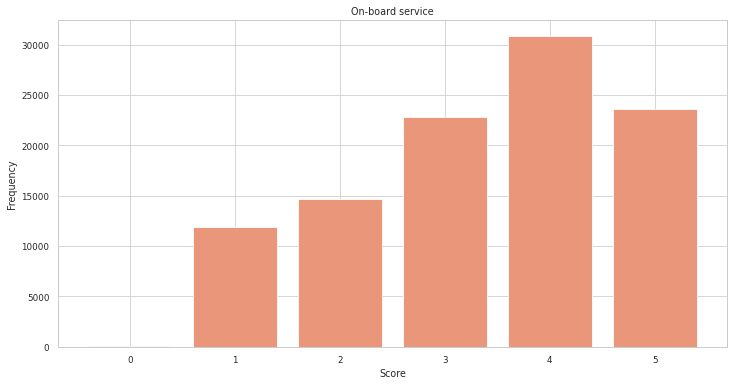

On-board service: 
 4    30867
5    23648
3    22833
2    14681
1    11872
0        3
Name: On-board service, dtype: int64


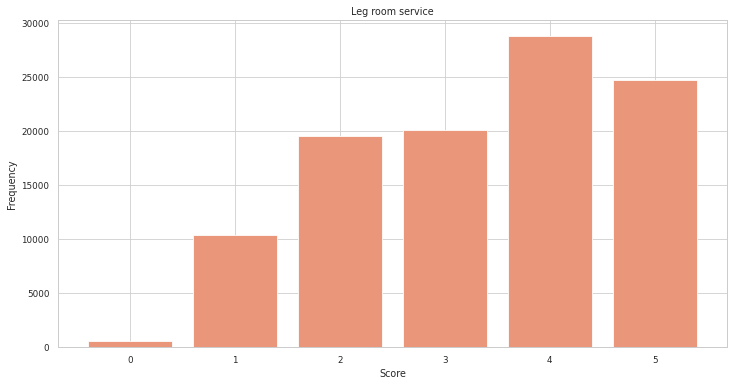

Leg room service: 
 4    28789
5    24667
3    20098
2    19525
1    10353
0      472
Name: Leg room service, dtype: int64


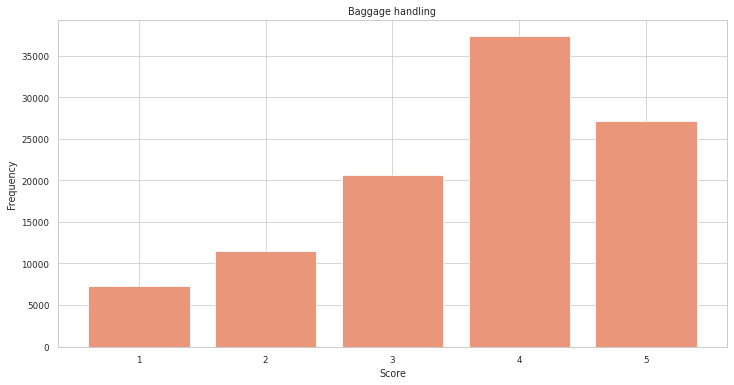

Baggage handling: 
 4    37383
5    27131
3    20632
2    11521
1     7237
Name: Baggage handling, dtype: int64


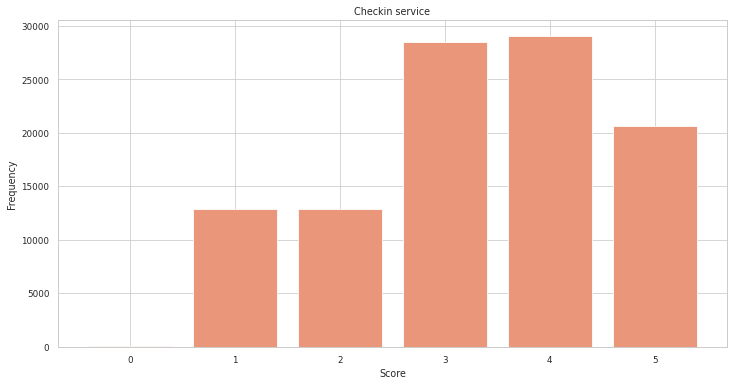

Checkin service: 
 4    29055
3    28446
5    20619
2    12893
1    12890
0        1
Name: Checkin service, dtype: int64


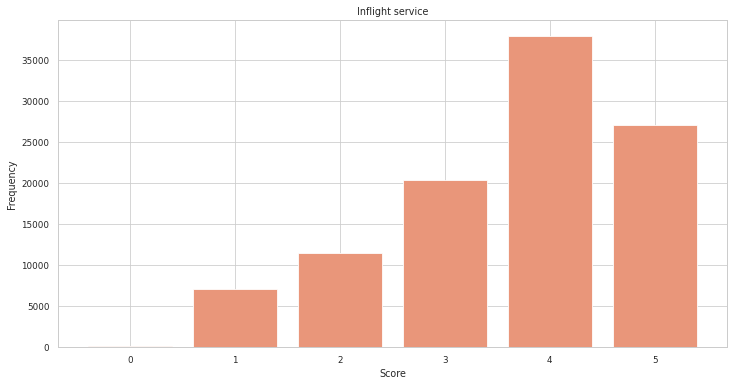

Inflight service: 
 4    37945
5    27116
3    20299
2    11457
1     7084
0        3
Name: Inflight service, dtype: int64


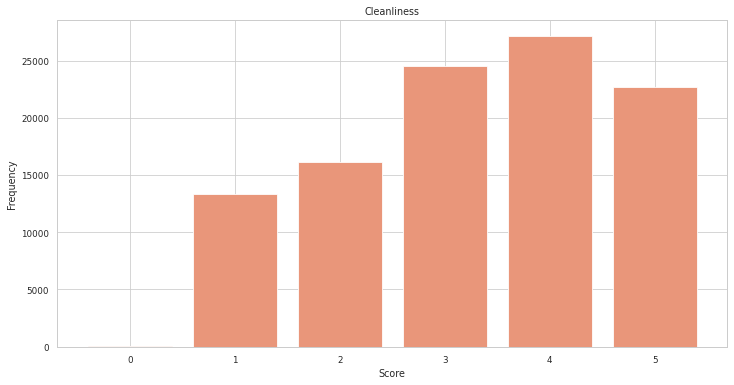

Cleanliness: 
 4    27179
3    24574
5    22689
2    16132
1    13318
0       12
Name: Cleanliness, dtype: int64


In [ ]:
likert = ["Inflight wifi service", "Departure/Arrival time convenient", 	
               "Ease of Online booking", 	"Gate location", 	"Food and drink", "Online boarding",
               "Seat comfort","Inflight entertainment","On-board service",
               "Leg room service","Baggage handling","Checkin service",
               "Inflight service","Cleanliness",]
for c in likert:
    bar_plot(c)

In [ ]:
airline_likert = airline.copy()

In [ ]:
likert2 = { 'Inflight wifi service' : [airline_likert['Inflight wifi service'].mean()],
'Departure/Arrival time convenient' : [airline_likert['Departure/Arrival time convenient'].mean()],
'Ease of Online booking' : [airline_likert['Ease of Online booking'].mean()],''
'Gate location' : [airline_likert['Gate location'].mean()],
'Food and drink' : [airline_likert['Food and drink'].mean()],
'Online boarding' : [airline_likert['Online boarding'].mean()],
'Seat comfort' : [airline_likert['Seat comfort'].mean()],
'Inflight entertainment' : [airline_likert['Inflight entertainment'].mean()],
'On-board service' : [airline_likert['On-board service'].mean()],
'Leg room service' : [airline_likert['Leg room service'].mean()],
'Baggage handling' : [airline_likert['Baggage handling'].mean()],
'Checkin service' : [airline_likert['Checkin service'].mean()],
'Inflight service' : [airline_likert['Inflight service'].mean()],
'Cleanliness' : [airline_likert['Cleanliness'].mean()]}

df_likert = pd.DataFrame(likert2).stack()
df_likert = df_likert.sort_values(ascending=False)
df_likert

0  Inflight service                     3.640428
   Baggage handling                     3.631833
   Seat comfort                         3.439396
   On-board service                     3.382363
   Inflight entertainment               3.358158
   Leg room service                     3.351055
   Checkin service                      3.304290
   Cleanliness                          3.286351
   Online boarding                      3.250375
   Food and drink                       3.202129
   Departure/Arrival time convenient    3.060296
   Gate location                        2.976883
   Ease of Online booking               2.756901
   Inflight wifi service                2.729683
dtype: float64

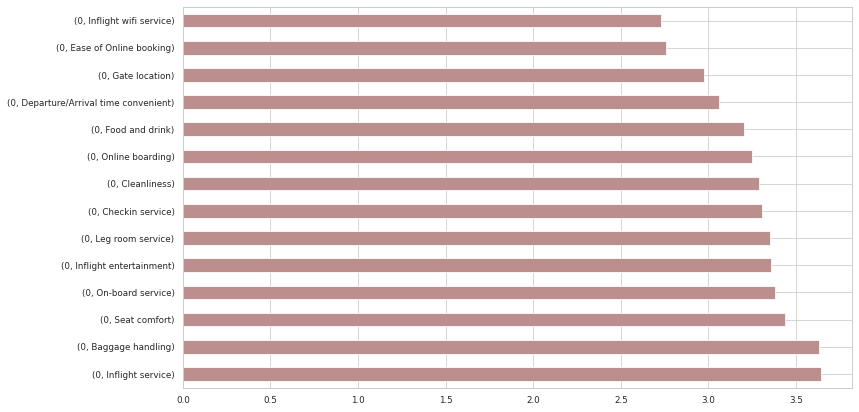

In [ ]:
df_likert.plot(kind="barh",color='rosybrown',figsize=(12,7))

#### **Distribusi Variabel Numerik**

In [ ]:
def plot_hist(variable):
    plt.figure(figsize=(12,6))
    plt.hist(airline[variable],bins=50,color='darkcyan')
    plt.xlabel(variable)
    plt.ylabel("Fruequency")
    plt.title("{} distribution with histogram".format(variable))
    plt.show()

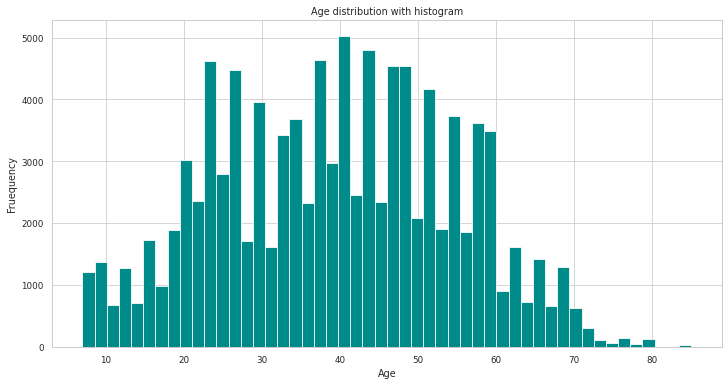

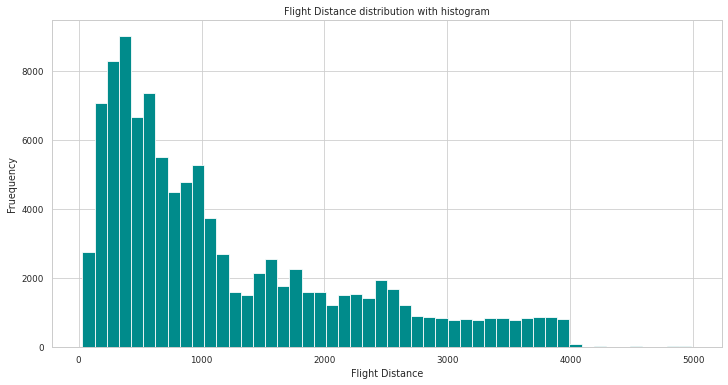

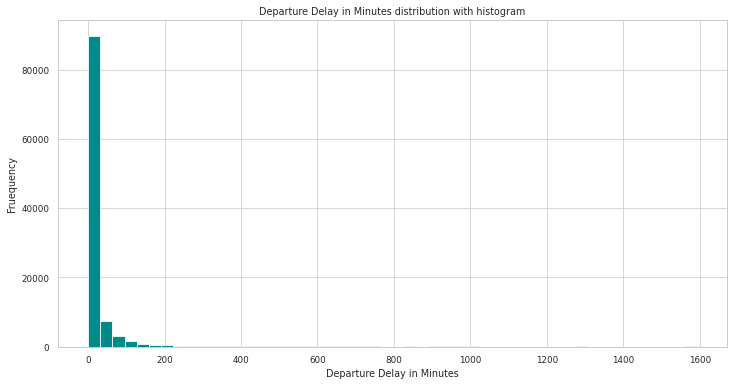

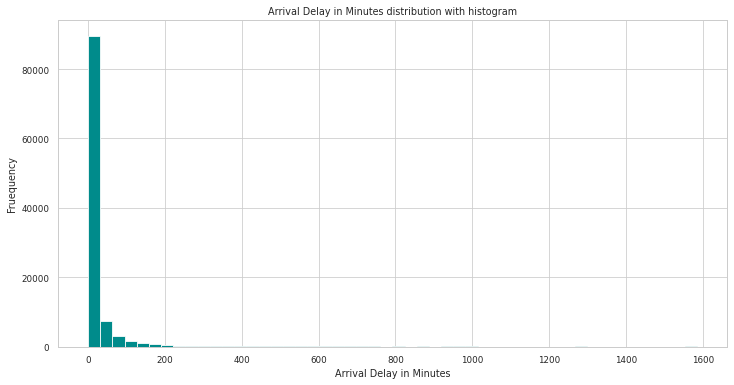

In [ ]:
numerik=["Age", "Flight Distance", "Departure Delay in Minutes", "Arrival Delay in Minutes"]
for n in numerik:
    plot_hist(n)

#### ***Class Proportion Detection***

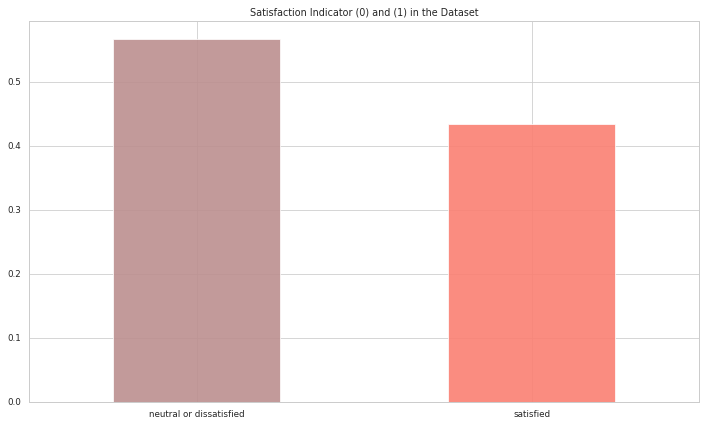

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (12,7))
airline.satisfaction.value_counts(normalize = True).plot(kind='bar', color= ['rosybrown','salmon'], alpha = 0.9, rot=0)
plt.title('Satisfaction Indicator (0) and (1) in the Dataset')
plt.savefig("class prop.png")
plt.show()

Berdasarkan hasil barplot di atas, tidak terlihat adanya ketidakseimbangan yang signifikan (selisih signifikan) antara kelas `satisfied` dengan `neutral/dissatisfied`. Oleh karena itu, tidak perlu dilakukan penanganan proporsi kelas agar seimbang.

In [ ]:
# files.download("class prop.png") 

## ***Outliers Detection***

### **Visualisasi Pendeteksian *Outlier***

In [ ]:
# Membuat Dataset tanpa Variabel Kategorik
numerical_features = airline.select_dtypes(exclude=['category']).copy()
numerical_features

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,13,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0
1,25,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0
2,26,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0
3,25,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0
4,61,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,23,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0
103900,49,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0
103901,30,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0
103902,22,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0


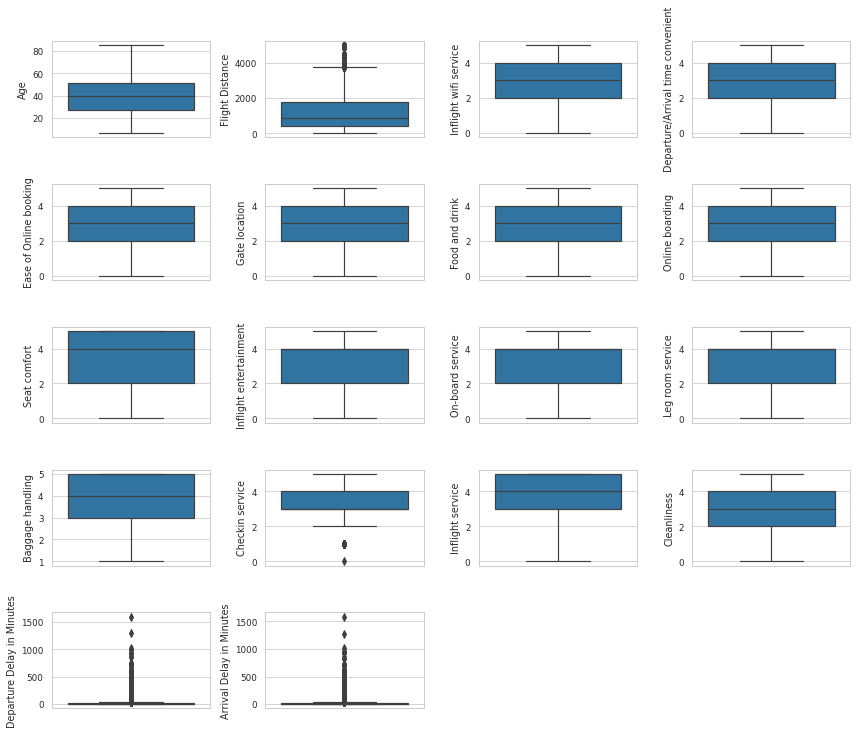

In [ ]:
# Visualisasi Sebelum Outlier Ditangani
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,18))

for i in range(len(numerical_features.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=numerical_features.iloc[:,i])

plt.tight_layout()
plt.show()

Dari boxplot tersebut, diperoleh informasi bahwa ditemukan outliers pada variabel berikut :
- `Flight Distance`
- `Checkin service`
- `Departure Delay in Minutes`
- `Arrival Delay in Minutes`

sehingga perlu dilakukan penanganan outliers.

### **Mengatasi *Oulier***

In [ ]:
Q1 = (airline[['Flight Distance','Checkin service', 'Departure Delay in Minutes','Arrival Delay in Minutes']]).quantile(0.25)
Q3 = (airline[['Flight Distance','Checkin service', 'Departure Delay in Minutes','Arrival Delay in Minutes']]).quantile(0.75)
IQR = Q3-Q1

max = Q3 + (1.5*IQR)
min = Q1 - (1.5*IQR)

airline['Flight Distance'].mask(airline['Flight Distance']>max['Flight Distance'],max['Flight Distance'],inplace=True)
airline['Checkin service'].mask(airline['Checkin service']<min['Checkin service'],min['Checkin service'],inplace=True)
airline['Departure Delay in Minutes'].mask(airline['Departure Delay in Minutes']>max['Departure Delay in Minutes'],max['Departure Delay in Minutes'],inplace=True)
airline['Arrival Delay in Minutes'].mask(airline['Arrival Delay in Minutes']>max['Arrival Delay in Minutes'],max['Arrival Delay in Minutes'],inplace=True)

In [ ]:
numerical_features = airline.select_dtypes(exclude=['category']).copy()
numerical_features

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,13,460.0,3,4,3,1,5,3,5,5,4,3,4,4.0,5,5,25,18.0
1,25,235.0,3,2,3,3,1,3,1,1,1,5,3,1.5,4,1,1,6.0
2,26,1142.0,2,2,2,2,5,5,5,5,4,3,4,4.0,4,5,0,0.0
3,25,562.0,2,5,5,5,2,2,2,2,2,5,3,1.5,4,2,11,9.0
4,61,214.0,3,3,3,3,4,5,5,3,3,4,4,3.0,3,3,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,23,192.0,2,1,2,3,2,2,2,2,3,1,4,2.0,3,2,3,0.0
103900,49,2347.0,4,4,4,4,2,4,5,5,5,5,5,5.0,5,4,0,0.0
103901,30,1995.0,1,1,1,3,4,1,5,4,3,2,4,5.0,5,4,7,14.0
103902,22,1000.0,1,1,1,5,1,1,1,1,4,5,1,5.0,4,1,0,0.0


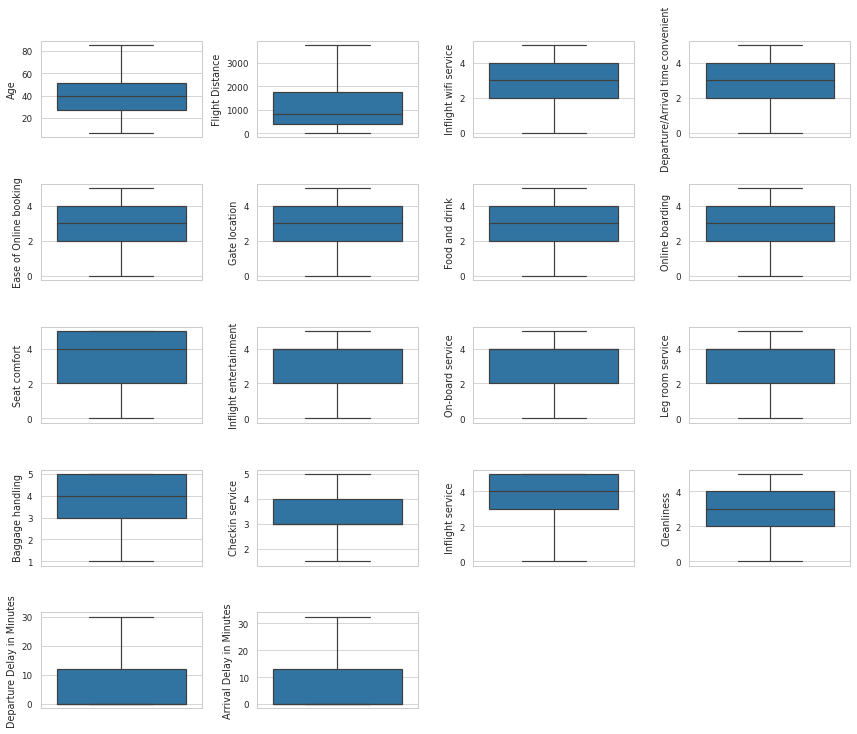

In [ ]:
# Visualisasi Setelah Outlier Ditangani
fig = plt.figure(figsize=(12,18))

for i in range(len(numerical_features.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=numerical_features.iloc[:,i])

plt.tight_layout()
plt.show()

## ***Building a Model***

### **Encoding Data**

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Convert Semua Variabel Non-Numerik menjadi Variabel Bertipe Numerik
for column in airline.columns:
    if airline[column].dtype == np.number: continue
    # Perform Encoding untuk Setiap Variabel Non-Numerik
    airline[column] = LabelEncoder().fit_transform(airline[column])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.
  after removing the cwd from sys.path.


In [ ]:
print('\nDataset Setelah Encoding, adalah:')
airline.describe()


Dataset Setelah Encoding, adalah:


,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,0.492541,0.182678,32.379052,0.310373,0.594135,1186.133927,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,2.631833,3.366333,3.640428,3.286351,7.396299,7.909493,0.433333
std,0.499947,0.386404,15.113075,0.462649,0.620799,988.126724,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.158642,1.175663,1.312273,11.223866,11.965566,0.495538
min,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,20.000000,0.000000,0.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,2.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,33.000000,0.000000,1.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,44.000000,1.000000,1.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,12.000000,13.000000,1.000000
max,1.000000,1.000000,74.000000,1.000000,2.000000,3736.500000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,5.000000,5.000000,5.000000,30.000000,32.500000,1.000000


In [ ]:
airline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  float64
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

### **Splitting Data**
> Membagi data set menjadi dua bagian yaitu 80% training dan 20% testing.

In [ ]:
# Mendefinisikan Variabel Independen (x) dan Variabel Dependen (y)
x = airline.drop('satisfaction', axis=1)
y = airline['satisfaction']

In [ ]:
# Membagi Dataset
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape)

(83123, 22) (20781, 22)


### **Model Building**

> Berikut adalah beberapa model yang akan kami coba untuk kemudian menentukan model terbaik:
* Regresi Logistik
* Random Forest
* Decision Tree
* Naive Bayes
* KNN Classifier

#### ***Logistic Regression***

In [ ]:
from sklearn.linear_model import LogisticRegression

# Train the Model
log_model = LogisticRegression().fit(X_train, y_train)
print(log_model)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [ ]:
# Predict
y_test_pred_log = log_model.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Print Classification Report
print('Classification Report Testing Model (Logistic Regression):')
print(classification_report(y_test, y_test_pred_log))

Classification Report Testing Model (Logistic Regression):
              precision    recall  f1-score   support

           0       0.86      0.81      0.84     11713
           1       0.78      0.83      0.80      9068

    accuracy                           0.82     20781
   macro avg       0.82      0.82      0.82     20781
weighted avg       0.82      0.82      0.82     20781



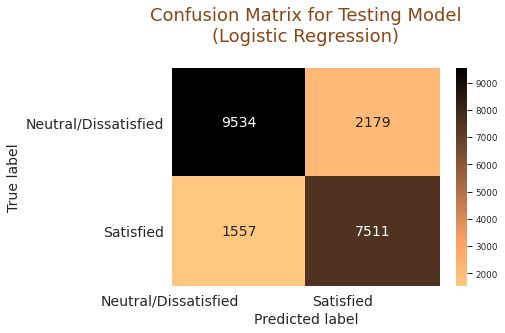

In [ ]:
# Form Confusion Matrix as a DataFrame
confusion_matrix_log = pd.DataFrame((confusion_matrix(y_test, y_test_pred_log)), ('Neutral/Dissatisfied', 'Satisfied'), ('Neutral/Dissatisfied', 'Satisfied'))

# Plot Confusion Matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_log, annot=True, annot_kws={'size': 14}, fmt='d', cmap='copper_r')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(Logistic Regression)\n', fontsize=18, color='saddlebrown')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### **Gaussian Naive Bayes**

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Train the Model
gnb_model = GaussianNB().fit(X_train,y_train)
print(gnb_model)

GaussianNB(priors=None, var_smoothing=1e-09)


In [ ]:
# Predict
y_test_pred_gnb = gnb_model.predict(X_test)

# Print Classification Report
print('Classification Report Testing Model (Gaussian Naive Bayes):')
print(classification_report(y_test, y_test_pred_gnb))

Classification Report Testing Model (Gaussian Naive Bayes):
              precision    recall  f1-score   support

           0       0.87      0.90      0.89     11713
           1       0.87      0.82      0.85      9068

    accuracy                           0.87     20781
   macro avg       0.87      0.86      0.87     20781
weighted avg       0.87      0.87      0.87     20781



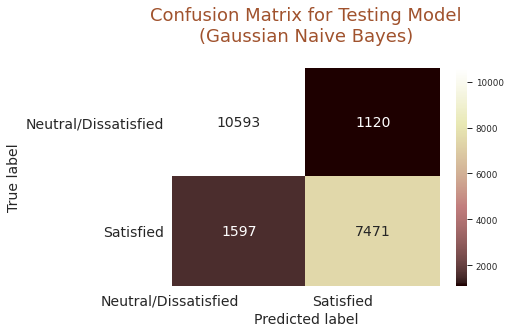

In [ ]:
# Form Confusion Matrix as a DataFrame
confusion_matrix_gnb = pd.DataFrame((confusion_matrix(y_test, y_test_pred_gnb)), ('Neutral/Dissatisfied', 'Satisfied'), ('Neutral/Dissatisfied', 'Satisfied'))

# Plot Confusion Matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_gnb, annot=True, annot_kws={'size': 14}, fmt='d', cmap='pink')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(Gaussian Naive Bayes)\n', fontsize=18, color='sienna')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### ***K-Nearest Neighbor Classifier***

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Train the Model
knn_model = KNeighborsClassifier().fit(X_train,y_train)
print(knn_model)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')


In [ ]:
# Predict
y_test_pred_knn = knn_model.predict(X_test)

# Print Classification Report
print('Classification Report Testing Model (K-NeighborsClassifier):')
print(classification_report(y_test, y_test_pred_knn))

Classification Report Testing Model (K-NeighborsClassifier):
              precision    recall  f1-score   support

           0       0.77      0.82      0.80     11713
           1       0.75      0.68      0.72      9068

    accuracy                           0.76     20781
   macro avg       0.76      0.75      0.76     20781
weighted avg       0.76      0.76      0.76     20781



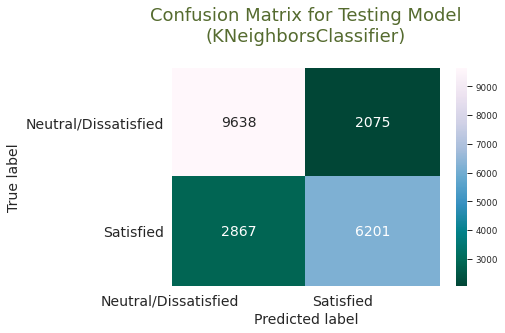

In [ ]:
# Form Confusion Matrix as a DataFrame
confusion_matrix_knn = pd.DataFrame((confusion_matrix(y_test, y_test_pred_knn)), ('Neutral/Dissatisfied', 'Satisfied'), ('Neutral/Dissatisfied', 'Satisfied'))

# Plot Confusion Matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_knn, annot=True, annot_kws={'size': 14}, fmt='d', cmap='PuBuGn_r')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(KNeighborsClassifier)\n', fontsize=18, color='darkolivegreen')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### ***Decision Tree Classifier* (Model Terpilih ✓)**

Model `decision tree` menjadi model terpilih karena model ini menghasilkan nilai presisi tertinggi kedua setelah model `random forest` dan dapat memberikan interpretasi yang insightful. 

Mengapa kami tidak memilih model `random forest` ? alasannya, karena model ini menghasilkan `tree` yang sangat kompleks sehingga sulit untuk diiinterpretasikan, sedangkan perbedaan nilai presisi yang dihasilkan pun  tidak memiliki selisih yang signifikan.

##### ***Tuning Hyperparameter***

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier 

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score
param_grid = {'max_depth' : np.arange(3,10),
              'min_samples_split' : np.arange(2,10),
              'min_samples_leaf' : np.arange(1,10)}

# Create a Randomized Search CV object
dt = DecisionTreeClassifier()
random_grid_dt = RandomizedSearchCV(
    estimator = dt,
    param_distributions = param_grid,
    scoring = 'roc_auc',
    random_state=0,
    cv = 10)
print(random_grid_dt)

RandomizedSearchCV(cv=10, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
         

In [ ]:
random_grid_dt.fit(X_train,y_train)

RandomizedSearchCV(cv=10, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
         

In [ ]:
random_grid_dt.best_params_

{'max_depth': 9, 'min_samples_leaf': 6, 'min_samples_split': 6}

In [ ]:
random_grid_dt.best_score_

0.9855951948088176

##### ***Train the Model***

In [ ]:
# Train the Model
dt_model = DecisionTreeClassifier(max_depth=9,min_samples_leaf=6,min_samples_split=6).fit(X_train,y_train)
print(dt_model)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=9, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


##### ***Predicting Data Test***

In [ ]:
# Predict
y_test_pred_dt = dt_model.predict(X_test)

from sklearn.metrics import confusion_matrix, classification_report
# Print Classification Report
print('Classification Report Testing Model (Decision Tree Classifier):')
print(classification_report(y_test, y_test_pred_dt))

Classification Report Testing Model (Decision Tree Classifier):
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     11713
           1       0.94      0.92      0.93      9068

    accuracy                           0.94     20781
   macro avg       0.94      0.94      0.94     20781
weighted avg       0.94      0.94      0.94     20781



In [ ]:
# Underfit/Overfit Checking
y_train_pred_dt = dt_model.predict(X_train)

# Print Classification Report
print('Classification Report Training Model (Decision Tree Classifier):')
print(classification_report(y_train, y_train_pred_dt))

Classification Report Training Model (Decision Tree Classifier):
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     47166
           1       0.95      0.92      0.93     35957

    accuracy                           0.94     83123
   macro avg       0.94      0.94      0.94     83123
weighted avg       0.94      0.94      0.94     83123



Karena precision dari prediksi `data test` dan `data train` memiliki nilai yang sama, yaitu sebesar **0.93** maka dapat dikatakan bahwa model sudah sangat baik dan tidak terjadi *underfitting* maupun *overfitting*.

##### ***Confusion Matrix***

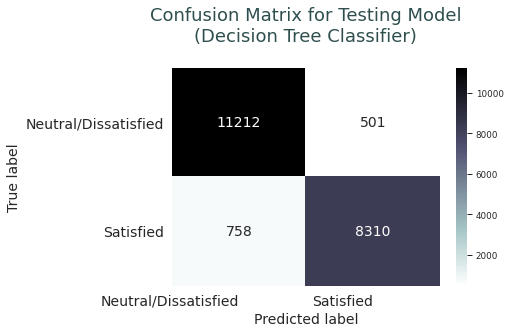

In [ ]:
# Form Confusion Matrix as a DataFrame
confusion_matrix_dt = pd.DataFrame((confusion_matrix(y_test, y_test_pred_dt)), ('Neutral/Dissatisfied', 'Satisfied'), ('Neutral/Dissatisfied', 'Satisfied'))

# Plot Confusion Matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_dt, annot=True, annot_kws={'size': 14}, fmt='d', cmap='bone_r')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(Decision Tree Classifier)\n', fontsize=18, color='darkslategrey')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.savefig('cm tree.png', bbox_inches='tight', pad_inches=0)
plt.show()

Keterangan:
- 11212 True Positive (ketika memprediksi neutral/dissatisfied, dan benar)
- 8310 True Negative (ketika memprediksi satisfied, dan benar)
- 758 False Positive (ketika memprediksi neutral/dissatisfied, dan salah)
- 501 False Negative (ketika memprediksi satisfied, dan salah)

In [ ]:
# files.download("cm tree.png") 

##### ***Decision Tree Graph***

In [ ]:
!apt install -y graphviz
!pip install graphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.


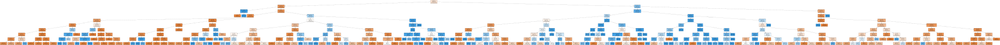

In [ ]:
import graphviz

# DOT Data
feature_cols= ["Gender", "Customer Type","Age", "Type of Travel", "Class", 
               "Flight Distance", "Inflight wifi service", "Departure/Arrival time convenient", 	
               "Ease of Online booking", 	"Gate location", 	"Food and drink", "Online",
               "Seat comfort","Inflight entertainment","On-board service",
               "Leg room service","Baggage handling","Checkin service",
               "Inflight service","Cleanliness","Departure Delay in Minutes","Arrival Delay in Minutes"]
dot_data = tree.export_graphviz(dt_model, out_file=None, feature_names = feature_cols, class_names = ['Neutral/Dissatisfied', 'Satisfied'],
                                filled=True)

# Draw Graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [ ]:
# Save Image
import pylab
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
import pydotplus

dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['Neutral/Dissatisfied', 'Satisfied'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtgraph.png')

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.886649 to fit



True

In [ ]:
# files.download("dtgraph.png") 


##### ***Feature Importances***

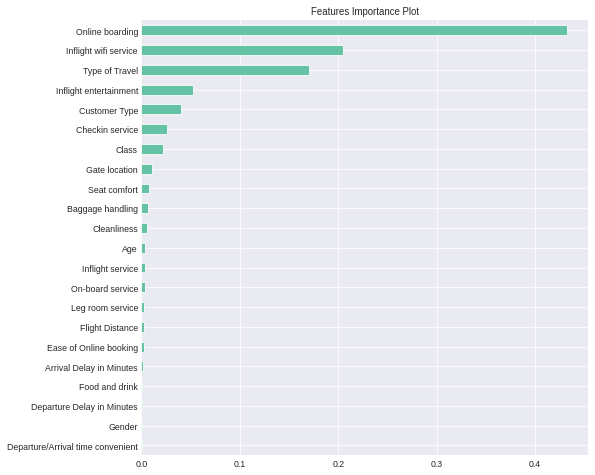

In [ ]:
# Feature Importance Plot
importances_dt = pd.Series(data=dt_model.feature_importances_,
                        index= X_train.columns)
importances_dt = importances_dt.sort_values(ascending=True)

plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(8,8))
importances_dt.plot(kind='barh', cmap='Set2')
plt.title('Features Importance Plot')
plt.savefig("feature importance.png", bbox_inches='tight', pad_inches=0)
plt.show()

In [ ]:
# files.download("feature importance.png") 

#### ***Random Forest Classifier***

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train the Model
rf_model = RandomForestClassifier().fit(X_train, y_train)
print(rf_model)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


In [ ]:
# Predict
y_test_pred_rf = rf_model.predict(X_test)
from sklearn.metrics import confusion_matrix, classification_report
# Print Classification Report
print('Classification Report Testing Model (Random Forest Classifier):')
print(classification_report(y_test, y_test_pred_rf))

Classification Report Testing Model (Random Forest Classifier):
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     11713
           1       0.97      0.94      0.96      9068

    accuracy                           0.96     20781
   macro avg       0.96      0.96      0.96     20781
weighted avg       0.96      0.96      0.96     20781



In [ ]:
# Underfit/Overfit Checking
y_train_pred_dt = rf_model.predict(X_train)

# Print Classification Report
print('Classification Report Training Model (Decision Tree Classifier):')
print(classification_report(y_train, y_train_pred_dt))

Classification Report Training Model (Decision Tree Classifier):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     47166
           1       1.00      1.00      1.00     35957

    accuracy                           1.00     83123
   macro avg       1.00      1.00      1.00     83123
weighted avg       1.00      1.00      1.00     83123



Karena precision dari prediksi `data train` = **1** dan `data test` memiliki nilai yang tidak jauh berbeda, yaitu sebesar **0.95** maka dapat dikatakan bahwa model sudah cukup baik dan tidak terjadi *underfitting* maupun *overfitting*.

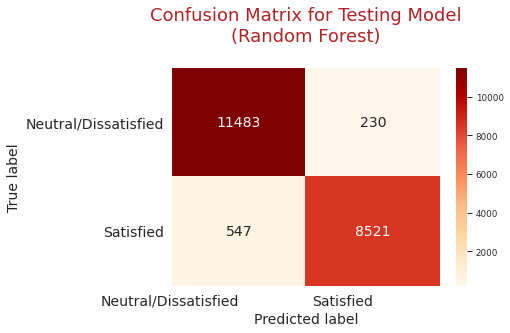

In [ ]:
# Form Confusion Matrix as a DataFrame
confusion_matrix_rf = pd.DataFrame((confusion_matrix(y_test, y_test_pred_rf)), ('Neutral/Dissatisfied', 'Satisfied'), ('Neutral/Dissatisfied', 'Satisfied'))

# Plot Confusion Matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_rf, annot=True, annot_kws={'size': 14}, fmt='d', cmap='OrRd')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(Random Forest)\n', fontsize=18, color='firebrick')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

Feature ranking:
1. feature 11 (0.181008)
2. feature 6 (0.139734)
3. feature 4 (0.123389)
4. feature 3 (0.081423)
5. feature 13 (0.054359)
6. feature 12 (0.044455)
7. feature 8 (0.039507)
8. feature 15 (0.038688)
9. feature 5 (0.036700)
10. feature 1 (0.033849)
11. feature 2 (0.032988)
12. feature 14 (0.026344)
13. feature 19 (0.025632)
14. feature 16 (0.025544)
15. feature 17 (0.024566)
16. feature 18 (0.023041)
17. feature 9 (0.016435)
18. feature 7 (0.015556)
19. feature 10 (0.012138)
20. feature 21 (0.010644)
21. feature 20 (0.009185)
22. feature 0 (0.004818)


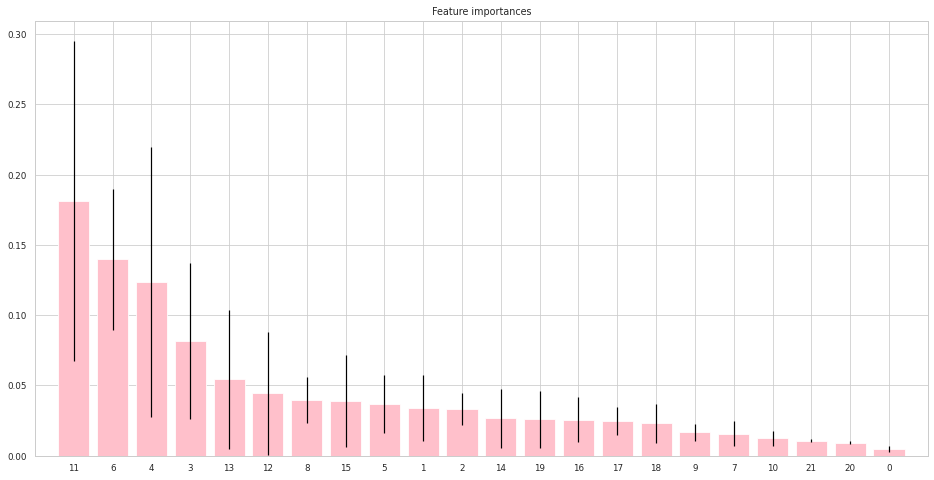

In [ ]:
# Varible Importance
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier().fit(X_train,y_train)
importances = rf_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf_model.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# Print the Feature Ranking
print("Feature ranking:")
for f in range(x.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the Feature Importances of the Forest
plt.figure(figsize=(16,8))
plt.title("Feature importances")
plt.bar(range(x.shape[1]), importances[indices],color="pink", yerr=std[indices],align="center")
plt.xticks(range(x.shape[1]), indices)
plt.xlim([-1, x.shape[1]])
plt.show()

In [ ]:
import graphviz
from sklearn import tree

# DOT Data
feature_cols= ["Gender", "Customer Type","Age", "Type of Travel", "Class", 
               "Flight Distance", "Inflight wifi service", "Departure/Arrival time convenient", 	
               "Ease of Online booking", 	"Gate location", 	"Food and drink", "Online",
               "Seat comfort","Inflight entertainment","On-board service",
               "Leg room service","Baggage handling","Checkin service",
               "Inflight service","Cleanliness","Departure Delay in Minutes","Arrival Delay in Minutes"]
dot_data_rf = tree.export_graphviz(rf_model.estimators_[0], out_file=None, feature_names = feature_cols, class_names = ['Neutral/Dissatisfied', 'Satisfied'],
                                filled=True)

# Draw Graph
graph_rf = graphviz.Source(dot_data_rf, format="png") 
graph_rf

Dapat dilihat bahwa hasil tree dari model `random forest` sangatlah kompleks sehingga sulit untuk diinterpretasikan.

# <center><font color="black">**TERIMA KASIH**</font></center>